In [2]:
# imports
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
import os
import folium
import rtree
from datetime import datetime

# show graphs & charts inline
%matplotlib inline
plt.rcParams["figure.figsize"] = (15, 7) # define plot size
saved_style_state = matplotlib.rcParams.copy() # give us a style state to go back to

Importing a GeoDataFrame (GDF) containing all the suburbs in NSW

In [29]:
gdf_burbs = gpd.read_file("DATA/NOV21_NSW_LOC_POLYGON_shp/nsw_localities.shp") 
print("done")

done


We can plot this gdf right off the bat:

<AxesSubplot:>

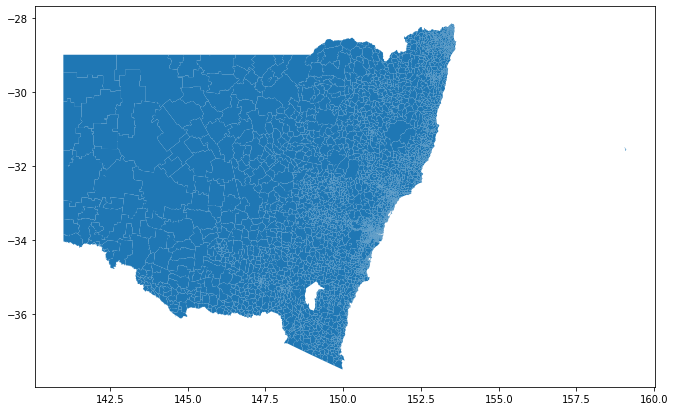

In [27]:
gdf_burbs.plot()

As you can see its quite dense, suburbs naturally spread out and take up more space the less dense population becomes. With a map like this we can easily see information plotted on the rural suburbs, but the city ones are so tight we won't be able to see much at all.

Looking at the first few rows of the gdf tells us what kind of information we have to work with. The main columns I'm interested are "LOC_NAME" and "geometry"

In [30]:
gdf_burbs.head(2)

,LC_PLY_PID,LOC_PID,DT_CREATE,LOC_NAME,LOC_CLASS,STATE,geometry
0,lcp012ec80364d0,loc56c2712d9100,2021-06-24,Aarons Pass,Gazetted Locality,NSW,"POLYGON ((149.79499 -32.82275, 149.79403 -32.8..."
1,lcp4c73aef97a2a,loc826143633965,2021-09-08,Abbotsbury,Gazetted Locality,NSW,"POLYGON ((150.87268 -33.86044, 150.87254 -33.8..."


Lets load in another dataset

In [31]:
df_crashData = pd.read_csv("data/NSW_Road_Crash_Data_2016-2020.csv")
print("done")

done


This dataset contains information about all the serious road crashes that took place in NSW between 2015 and 2020.

The `pd.read_csv` function creates a dataframe object, not a geodataframe. Although the df contains lattitude and logditude information, we won't be able to mess with it in geopandas unless we convert it to a geodataframe object.

This line uses the `points_from_xy` function to generate a geometry column that geopandas can use

In [35]:
gdf_crashData = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df_crashData.Longitude, df_crashData.Latitude))

Now that we are working with two gdfs, we can use do a Spatial Join (`sjoin` function) and combine them.

We're performing a left join, and using the argument `predicate="within"` to tell geopandas to add our newly converted geometry to the correct rows.

p.s. ignore the warning that running this line throws, it doesn't seem to matter

In [36]:
gdf_join = gdf_crashData.sjoin(gdf_burbs[["LOC_NAME", "geometry"]], how="left", predicate="within")

c:\Users\Louis\AppData\Local\Programs\Python\Python310\lib\site-packages\geopandas\geodataframe.py:2090: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4283

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)


Let's run a `value_counts` function, counting the number of crashes in each location, each year. We're going to send this data to a new frame and sort it by its name & year values

In [38]:
counts_by_year = gdf_join.value_counts(["Year of crash", "LOC_NAME"]).to_frame().reset_index().sort_values(["LOC_NAME", "Year of crash"])
counts_by_year.head(2)

,Year of crash,LOC_NAME,0
9656,2016,Aarons Pass,1
8618,2018,Aarons Pass,2


Now let's tidy the column names up a bit to make everything more manageable

In [40]:
counts_by_year.columns = ["year", "suburb", "crashes"]
counts_by_year.head(5)

,year,suburb,crashes
9656,2016,Aarons Pass,1
8618,2018,Aarons Pass,2
2090,2016,Abbotsbury,14
1752,2017,Abbotsbury,16
5860,2018,Abbotsbury,4


This is cool, but I think the data would be more meaningful if we could have each row be one location, and the columns be the years. We can use the `pivot` function to do that:

In [41]:
pivoted = counts_by_year.pivot(index="suburb", columns="year", values="crashes")
pivoted.head(2)

year,2015,2016,2017,2018,2019,2020
suburb,,,,,,
Aarons Pass,NaN,1.0,NaN,2.0,NaN,NaN
Abbotsbury,NaN,14.0,16.0,4.0,9.0,14.0


Now this next step is a bit funky. We're going to create a new gdf by merging our new pivot table with the gdf we put together earlier. Both dataframes have a column of matching suburb names, we will once again perform a left join to merge these gdfs around that column. The only data we really want from the orignal gdf is the geometry data, so lets just grab that!

In [42]:
pivoted_gdf = gpd.GeoDataFrame((pd.merge(pivoted, gdf_burbs[["LOC_NAME", "geometry"]], how="left", left_index=True, right_on="LOC_NAME")), geometry="geometry", crs=4326)
pivoted_gdf.head(2)

,2015,2016,2017,2018,2019,2020,LOC_NAME,geometry
0,NaN,1.0,NaN,2.0,NaN,NaN,Aarons Pass,"POLYGON ((149.79499 -32.82275, 149.79403 -32.8..."
1,NaN,14.0,16.0,4.0,9.0,14.0,Abbotsbury,"POLYGON ((150.87268 -33.86044, 150.87254 -33.8..."


Let's add a new column, summing all the crashes in a suburb over the years present in our dataset

In [43]:
sum_cols = [2015, 2016, 2017, 2018, 2019, 2020]

pivoted_gdf["total_crashes"] = pivoted_gdf[sum_cols].sum(axis=1)

We'll quickly replace any NaNs with 0s and convert all our values to integers so that everything doesn't break down the line

In [44]:
pivoted_gdf = pivoted_gdf.fillna(0)
pivoted_gdf[[2015, 2016, 2017, 2018, 2019, 2020, "total_crashes"]] = pivoted_gdf[[2015, 2016, 2017, 2018, 2019, 2020, "total_crashes"]].astype("int64")

Now lets sort everything in decending order

In [46]:
pivoted_gdf = pivoted_gdf.sort_values("total_crashes", ascending=False)
pivoted_gdf.head(10)

,2015,2016,2017,2018,2019,2020,LOC_NAME,geometry,total_crashes
180,1,222,216,165,163,146,Bankstown,"POLYGON ((151.03769 -33.90387, 151.03828 -33.9...",913
2406,0,213,192,138,131,120,Liverpool,"POLYGON ((150.91795 -33.90467, 150.91841 -33.9...",794
3777,1,199,173,176,144,93,Sydney,"POLYGON ((151.21567 -33.85619, 151.21568 -33.8...",786
106,1,227,169,112,123,87,Auburn,"POLYGON ((151.02634 -33.83503, 151.02643 -33.8...",719
2639,1,170,150,127,97,105,Merrylands,"POLYGON ((150.98705 -33.82279, 150.98710 -33.8...",650
398,1,125,154,127,104,133,Blacktown,"POLYGON ((150.92631 -33.75072, 150.92777 -33.7...",644
1793,0,166,130,97,112,91,Greenacre,"POLYGON ((151.06855 -33.88096, 151.06865 -33.8...",596
2361,0,166,152,82,99,84,Lidcombe,"POLYGON ((151.04466 -33.84239, 151.04471 -33.8...",583
2566,0,147,134,104,109,72,Mascot,"POLYGON ((151.18825 -33.92030, 151.18866 -33.9...",566
3212,1,151,138,104,96,66,Parramatta,"POLYGON ((151.00510 -33.80452, 151.00522 -33.8...",556


Pretty cool! We can see the top 10 most dangerous suburbs to drive in NSW. Interesting to note that 7 of them are in The Area... I wonder if this is related to differences in population density, or some other factor

We can take this dataset and do a simple `.plot` function, but as I mentioned earlier it becomes hard to see any detail with such a large area to cover

<AxesSubplot:>

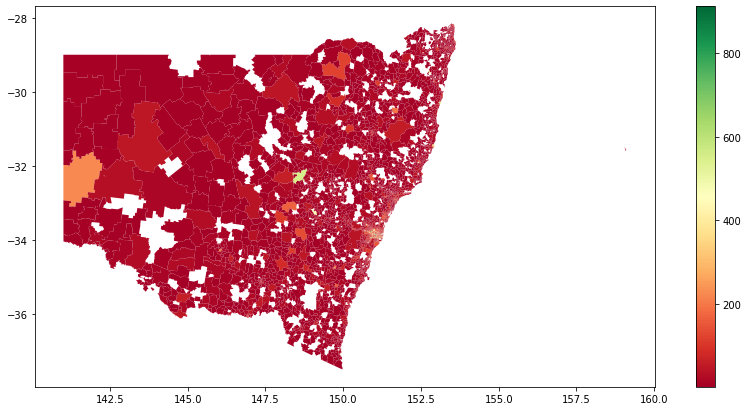

In [47]:
pivoted_gdf.plot(column="total_crashes", cmap="RdYlGn", legend=True)

The various gaps in the map are all areas with no data. Most of them are national parks, or the ACT, but some suburbs just don't have any data for some reason.

A much better (albeit more resource intensive) solution is to use the `.explore()` function. This generates an interactive map showing all the suburbs in NSW and the total number of crashes in each

Fair warning: This is a *very* heavy line to run. It might kill your computer. I would reccomend tweaking the areaNum variable for a more reasonable map

In [50]:
maxArea = len(pivoted_gdf)
areaNum = 500 # reduce this number to reduce the number of suburbs shown on the map. i.e. if you change it to 100, only the top 100 suburbs by total number of crashes will be shown

m = pivoted_gdf.drop([2015, 2016, 2017, 2018, 2019, 2020], axis=1).head(areaNum).explore(column="total_crashes", name="Total Crashes", cmap="turbo")
folium.LayerControl().add_to(m)
m